# Stable Diffusion: The Bridge Between Text and Image Modalities
## Author - Himanshu Singhal

## Motivation

In the rapidly evolving landscape of artificial intelligence, few developments have captured the public imagination quite like text-to-image generation models. Among these, Stable Diffusion stands out as a pivotal breakthrough that has democratized access to high-quality image generation.

I first explored Diffusion models back in my 2nd year and what really fascinated me about them is how you can create semantically meaningful images from pure noise, with just a prompt.
<!--
My fascination with Stable Diffusion stems from its elegant solution to a complex problem: how can we translate the rich semantic meaning of language into coherent visual representations? This question lies at the heart of multimodal learning—the frontier where different forms of data interpretation converge. -->

When Stability AI released Stable Diffusion as an open-source model in August 2022, it marked a significant departure from the closed ecosystems that had dominated AI image generation. Suddenly, anyone with modest computing resources could generate sophisticated imagery from text descriptions. This democratization sparked an explosion of creativity and innovation that continues to reverberate through art, design, and technology communities.

What drew me to explore this technology isn't just its impressive output quality, but the fascinating technical approach that makes it possible. Stable Diffusion's use of latent diffusion—operating in a compressed representation space rather than directly on pixels—represents an elegant solution to the computational challenges of image generation. The model's ability to bridge textual concepts and visual elements embodies the promise of multimodal AI: systems that can fluidly translate between different forms of information much as humans do.

In this blog, I'll dive into how Stable Diffusion works, examine its capabilities and limitations, and reflect on its significance in the broader evolution of multimodal learning systems.

## Historical Context: The Evolution of Text-to-Image Generation

To appreciate Stable Diffusion's significance, we need to understand its place in the evolution of text-to-image systems. This history reveals a fascinating progression of approaches to the multimodal challenge of translating words into visuals:

### Early GAN-Based Approaches (2016-2020)

The modern era of text-to-image synthesis began with Generative Adversarial Networks (GANs). These early models highlighted a fundamental challenge in multimodal learning: creating a shared semantic space that could meaningfully connect the statistical patterns of language with the visual features of images.

The results were promising but limited—like an artist who could grasp the basic subject of a description but lacked the skill to render it convincingly.


### The DALL-E Era (2021)

OpenAI's introduction of DALL-E in January 2021 represented a quantum leap forward. By leveraging a transformer-based architecture (similar to GPT-3) and training on 250 million text-image pairs, DALL-E demonstrated a remarkable ability to generate coherent images from complex prompts. It could handle abstract concepts, spatial relationships, and even some aspects of visual reasoning.

DALL-E's capabilities highlighted the power of large-scale training and transformer architectures for bridging modalities. However, its closed nature and massive computational requirements limited broader experimentation and application.

### The Diffusion Revolution (2021-2022)

While GANs dominated early text-to-image work, researchers were exploring an alternative approach: diffusion models. These models work by gradually removing noise from a random initial state, guided by the input text. OpenAI's GLIDE (2021) demonstrated that diffusion models could match or exceed GAN performance for text-to-image generation.

The diffusion approach offered several advantages: more stable training, better diversity, and improved handling of complex compositions. However, the computational cost remained prohibitive—until Stable Diffusion changed the game.

### Stable Diffusion: The Open Revolution (2022)

In August 2022, Stability AI, in collaboration with researchers from LMU Munich and Runway, released Stable Diffusion. Building on the latent diffusion approach introduced by Rombach et al., Stable Diffusion operated in a compressed latent space rather than pixel space, dramatically reducing computational requirements while maintaining quality.

Crucially, Stable Diffusion was released as an open-source model with a permissive license, allowing researchers, developers, and artists to run, modify, and build upon it. This openness catalyzed an unprecedented wave of innovation: within months, the community had developed techniques for image editing, personalization, animation, and much more.

### Recent Developments (2023-2025)

The pace of advancement has only accelerated since Stable Diffusion's release. Improved versions like SDXL have pushed quality boundaries, while specialized extensions like ControlNet have enabled more precise control over generation. The integration of diffusion models with other AI systems has enabled new multimodal applications from video generation to 3D synthesis.

Throughout this evolution, we've seen consistent progress toward more seamless translation between language and vision—the essence of multimodal learning. Stable Diffusion represents a pivotal moment in this journey, where powerful multimodal capabilities became accessible to a global community of creators and developers.

## Understanding Stable Diffusion's Architecture

At its core, Stable Diffusion represents a fascinating approach to bridging text and image modalities. Let's explore the key components that make this possible:

### The Multimodal Foundation

Stable Diffusion integrates three primary components that work together to translate text into images:

1. **Text Encoder (CLIP)**: Developed by OpenAI, the Contrastive Language-Image Pre-training (CLIP) model serves as the bridge between text and visual concepts. When you enter a prompt, CLIP encodes it into a high-dimensional embedding that captures the semantic meaning of your description.

2. **U-Net Denoiser with Cross-Attention**: The heart of the diffusion process, this component gradually transforms random noise into a coherent image. Critically, it uses cross-attention mechanisms to incorporate the text embeddings from CLIP, ensuring the emerging image aligns with your prompt.

3. **Variational Autoencoder (VAE)**: This component compresses images into a lower-dimensional latent space and reconstructs them back into pixel space. By operating in this compressed latent space, Stable Diffusion achieves significant efficiency gains compared to earlier diffusion models.

### The Latent Diffusion Process
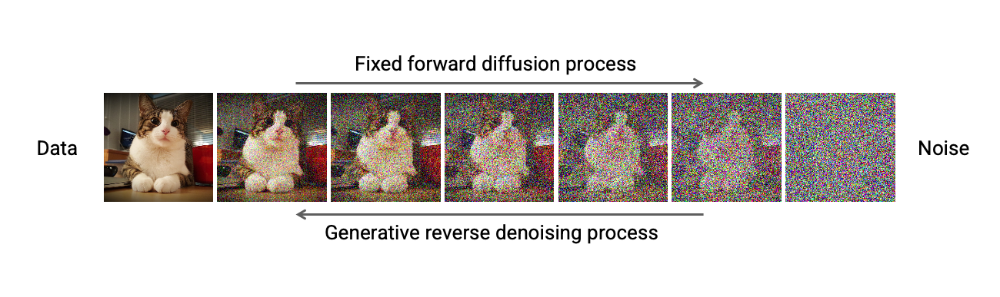
Stable Diffusion's name comes from its use of diffusion models—a class of generative models that work by reversing a gradual noising process. Here's how the generation process unfolds:

1. Start with pure noise in the latent space
2. Gradually denoise this representation over multiple steps
3. Guide this denoising process using the text embeddings from CLIP
4. Once denoising is complete, decode the latent representation to a full image

What makes this approach particularly elegant is that it operates in the compressed latent space rather than pixel space, reducing the computational burden by orders of magnitude while preserving the model's ability to generate detailed images.



For the following sections i'll explain the mathematics of these models by referring to the DDPM paper - which establishes a strong foundation for all diffusion models following it.

# The Forward Process

Now it's time to dive into the mathematics of diffusion models. The first thing we need is a tractable loss function that our neural network would optimize.

Let $q(x_0)$ be the real data distribution, say of "real images". We can sample from this distribution to get an image, $x_0 \sim q(x_0)$. We define the forward diffusion process $q(x_t|x_{t-1})$ which adds Gaussian noise at each time step $t$, according to a known variance schedule $0 < \beta_1 < \beta_2 < ... < \beta_T < 1$ as

$$q(x_t|x_{t-1}) = \mathcal{N}(x_t; \sqrt{1-\beta_t}x_{t-1}, \beta_t \mathbf{I}).$$

We'll talk more about the variance schedule in upcoming sections.

Now we know that a normal distribution (also called Gaussian distribution) is defined by 2 parameters: a mean $\mu$ and a variance $\sigma^2 \geq 0$. Basically, each new (slightly noisier) image at time step $t$ is drawn from a conditional Gaussian distribution with $\mu_t = \sqrt{1-\beta_t}x_{t-1}$ and $\sigma_t^2 = \beta_t$, which we can do by sampling $\epsilon \sim \mathcal{N}(0, \mathbf{I})$ (also called **isotropic gaussian**) and then setting $x_t = \sqrt{1-\beta_t}x_{t-1} + \sqrt{\beta_t}\epsilon$.

Note that the $\beta_t$ aren't constant at each time step $t$ (hence the subscript) — in fact one defines a so-called "variance schedule", which can be linear, quadratic, cosine, etc. as we will see further (a bit like a learning rate schedule).

So starting from $x_0$, we end up with $x_1, ..., x_t, ..., x_T$, where $x_T$ is pure Gaussian noise if we set the schedule appropriately.

## The Reverse Process

Before understanding the reverse diffusion process, we first need to understand variational autoencoders and how they work.

### Variational Autoencoder
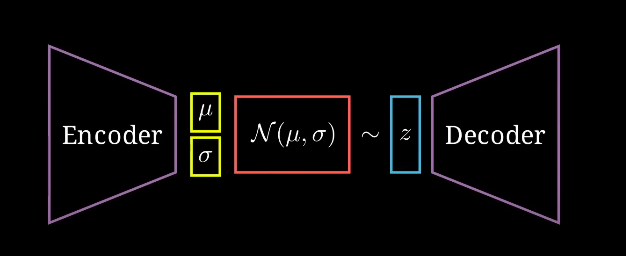

In diffusion, our goal is generate new data from a given distribution $p(x)$ (representing our dataset). But the issue is that w dont knwo the exact properties of this distribution as we only have access to the training samples. So to make our life easier, we introduce  another distribution $p(z)$ which is called the latent distribution (which represent latent variables - vectors in a lower dimensional that capture the core features of the data). We create mappings between the two which are $p(z|x)$ and $p(x|z)$.

So the core idea is that if we can sample vectors from the posterior distribution, those latents are likely to have been generated by images from our original data distribution, $p(x)$. So if we can reconstruct these latent vectors back into images we'll effectively generate new samples from our original data distribution.
But the main issue here is we dont know the exact form of the latent distrivution $p(z)$ either.

So we assume that the latent distribution is a normal distribution (isotropic gaussian to be precise). This allows us to construct $p(x|z)$. For the other way around we approximate $p(z|x) as:

$$ q(z|x) = p(z|x)$$

where $q(z|x) = \mathcal{N}(μ, σ)$. Here the parameters are learned by the neural network.
So we train a deep encoder to estimate these parameters from the images and then we'll use a decoder to reconstruct images from latent variables that are sampled from the approximate posterior we defined above.




## Defining an Objective Function (by Reparametrizing the Mean)

To derive an objective function to learn the mean of the backward process, the authors observe that the combination of $q$ and $p_\theta$ can be seen as a variational auto-encoder (VAE) (Kingma et al., 2013). Hence, the variational lower bound (also called ELBO) can be used to minimize the negative log-likelihood with respect to ground truth data sample $x_0$. It turns out that the ELBO for this process is a sum of losses at each time step $t$, $L = L_0 + L_1 + ... + L_T$. By construction of the forward $q$ process and backward process, each term (except for $L_0$) of the loss is actually the KL divergence between 2 Gaussian distributions which can be written explicitly as an L2-loss with respect to the means!

A direct consequence of the constructed forward process $q$, as shown by Sohl-Dickstein et al., is that we can sample $x_t$ at any arbitrary noise level conditioned on $x_0$ (since sums of Gaussians is also Gaussian). This is very convenient: we don't need to apply $q$ repeatedly in order to sample $x_t$. We have that

$$q(x_t|x_0) = \mathcal{N}(x_t; \sqrt{\bar{\alpha}_t}x_0, (1-\bar{\alpha}_t)\mathbf{I})$$

with $\alpha_t := 1-\beta_t$ and $\bar{\alpha}_t := \prod_{s=1}^t \alpha_s$.  This means we can sample Gaussian noise and scale it appropriately and add it to $x_0$ to get $x_t$ directly. Note that the $\bar{\alpha}_t$ are functions of the known $\beta_t$ variance schedule and thus are also known and can be precomputed. This then allows us, during training, to optimize random terms of the loss function $L$ (or in other words, to randomly sample $t$ during training and optimize $L_t$).

The final objective function $L_t$ then looks as follows (for a random time step $t$ given $\epsilon \sim \mathcal{N}(0, \mathbf{I})$):

$$\|\epsilon - \epsilon_\theta(x_t, t)\|^2 = \|\epsilon - \epsilon_\theta(\sqrt{\bar{\alpha}_t}x_0 + \sqrt{1-\bar{\alpha}_t}\epsilon, t)\|^2.$$

Here, $x_0$ is the initial (real, uncorrupted) image, and we see the direct noise level $t$ sample given by the fixed forward process. $\epsilon$ is the pure noise sampled at time step $t$, and $\epsilon_\theta(x_t, t)$ is our neural network. The neural network is optimized using a simple mean squared error (MSE) between the true and the predicted Gaussian noise.

## Training Algorithm

The training algorithm now looks as follows:

```
1. Repeat:
   - Sample x₀ ~ q(x₀) (real data)
   - Sample t ~ Uniform({1, 2, ..., T})
   - Sample ε ~ N(0, I)
   - Take gradient step on ∇_θ ||ε - ε_θ(√(ᾱₜ)x₀ + √(1-ᾱₜ)ε, t)||²
```

In other words:

1. We take a random sample $x_0$ from the real unknown and possibly complex data distribution $q(x_0)$
2. We sample a noise level $t$ uniformly between $1$ and $T$ (i.e., a random time step)
3. We sample some noise from a Gaussian distribution and corrupt the input by this noise at level $t$ (using the nice property defined above)
4. The neural network is trained to predict this noise based on the corrupted image $x_t$ (i.e. noise applied on $x_0$ based on known schedule $\beta_t$)

In reality, all of this is done on batches of data, as one uses stochastic gradient descent to optimize neural networks.

## **Variance Schedule**

In simple terms:

> **The variance schedule decides how much noise is added (and later removed) at each step of the diffusion process.**

It defines the **intensity** of the noise over time.

- **Variance** means "how spread out the noise is" — bigger variance = more noise.
- **Schedule** means "how the variance changes step-by-step."



###  **Why Does the Variance Schedule Matter?**

The variance schedule controls two crucial things:

#### **1. Training Stability**
If you add too much noise too quickly, the model gets overwhelmed. If you add too little noise, the model doesn't learn the denoising task properly.

#### **2. Sample Quality**
The reverse process (image generation) needs to undo the noise at each step. If the noise levels aren't well planned, the final images might be blurry, weird, or full of artifacts.

In short:  
**A good variance schedule = better training + prettier samples!**



### **What Do Typical Variance Schedules Look Like?**

Commonly used schedules include:

#### **Linear Schedule**
Noise variance increases linearly over time.  
Simple and surprisingly effective.

#### **Cosine Schedule**
Introduced in some newer papers (like *Improved DDPM*), where the noise levels follow a smooth cosine curve — starting slow, peaking in the middle, and slowing down again.

> ➔ Leads to more stable training and often better results!

Visually, imagine plotting the noise level across 1000 steps — you’d get a smooth curve (line, cosine wave, etc.) depending on your chosen schedule.



The schedule is usually defined by a set of **βₜ** (`beta_t`) values, where **t** is the timestep.

- **βₜ** controls how much noise you add at step **t**.
- The **variance** at each step is directly related to **βₜ**.

The model then learns to predict either:

- The original noise added (like in standard DDPMs), or
- The denoised image directly (in some improved versions).

In practice, you **precompute the βₜ values** according to your schedule and use them during both training and sampling.



## The Text Encoder

A transformer language model is used as the language understanding component that takes the text propmt and produces token embeddings. Stable Diffusion uses ClipText (A GPT-based model). These text encoders (for instance consider CLIP), are trained on a dataset of images and their captions - spanning more than 400 millions of image-caption pairs.

CLIP is a combination of an image encoder and a text encoder. Both of these are encoded with image and its caption respectively. We then compare the resulting embeddinsg using cosine similarity. Eventually as the training progresses, the model learns to put similar embeddings closer to each other. Therefore it can produce embeddings where an image of a tower and the sentence "a picture of a tower" are similar. 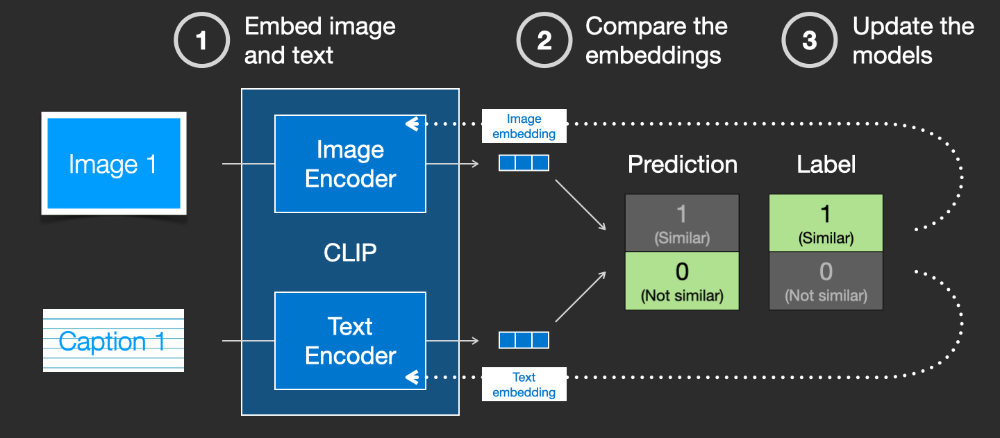

## How it fits in our model

- First, the text prompt provided is fed into the **text encoder**.
- The text encoder then turns that text into its embedding that captures the semantic meaning of that prompt.
- This **text embedding** is then used to guide the diffusion model during the image generation process.
- Specifically, the denoising model (usually a U-Net) **conditions** each denoising step on the text embedding, so the noise removal is not random but guided towards producing an image that matches the text.


A common approach to do this is called **classifier-free guidance**. With this method, unconditional noise esti-
mates (usually obtained by passing the null text prompt as conditioning) and conditional noise estimates are combined
together:

$$
\epsilon_t^{\text{CFG}} = \epsilon_\theta(\mathbf{x}_t, t, \emptyset) + \gamma \left( \epsilon_\theta(\mathbf{x}_t, t, y) - \epsilon_\theta(\mathbf{x}_t, t, \emptyset) \right).
\tag{1}
$$

Here, $\emptyset$ denotes the embedding of the empty string and $\gamma$ is a parameter that controls the strength of the guidance.  
Classifier-free guidance acts to sharpen the distribution of generated images to produce higher quality results.



### The Multimodal Magic: Cross-Attention

The true multimodal innovation in Stable Diffusion lies in its cross-attention mechanism. This allows the model to create connections between specific words in your prompt and visual elements in the generated image. For example, when you write "a red car on a beach at sunset," cross-attention helps the model associate "red" with the color of the car, "beach" with sandy textures, and "sunset" with warm lighting conditions.

This mapping between language and visual concepts is learned during training on millions of image-text pairs, creating a rich semantic space where textual and visual information can interact. The result is a system that doesn't just generate images that vaguely match a description, but one that can understand and implement specific visual attributes, compositions, and styles mentioned in the prompt.

## Setting Up Our Environment

Before we dive into experimenting with Stable Diffusion, let's set up our environment with the necessary libraries. This code installs the required packages and imports the necessary modules.

In [1]:
!pip install diffusers transformers peft torch accelerate scipy ftfy safetensors
!pip install matplotlib numpy scikit-learn pandas
!pip install huggingface-hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 79.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 56.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 103.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [2]:
# Import libraries
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from diffusers import StableDiffusionPipeline, DiffusionPipeline, StableDiffusionImg2ImgPipeline
from diffusers import EulerDiscreteScheduler, DDIMScheduler, DPMSolverMultistepScheduler
from transformers import CLIPTokenizer, CLIPTextModel
from sklearn.manifold import TSNE
import random
import time
import os
from IPython.display import display
from tqdm.auto import tqdm

# Set a seed for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# Helper function to create output directories
def create_output_dir(dir_name="outputs"):
    if not os.path.exists(dir_name):
        os.makedirs(dir_name)
    return dir_name

output_dir = create_output_dir()

# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


Now, let's load the Stable Diffusion model. We'll use version 1.5, which balances quality and efficiency well. This step might take a few minutes as it downloads the model weights (about 4GB).

In [6]:
# Load the model
model_id = "runwayml/stable-diffusion-v1-5"  # We're using v1.5 for this exploration

# Load the pipeline with a scheduler optimized for quality
scheduler = EulerDiscreteScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    scheduler=scheduler,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32
)
pipe = pipe.to(device)

# Try to enable memory efficient attention if on CUDA
if device == "cuda":
    try:
        # First try xformers
        pipe.enable_xformers_memory_efficient_attention()
        print("Using xformers for efficient attention")
    except (ModuleNotFoundError, ImportError):
        # Fall back to attention slicing if xformers is not available
        print("xformers not available, using attention slicing instead")
        pipe.enable_attention_slicing()
        print("Enabled attention slicing for memory efficiency")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

xformers not available, using attention slicing instead
Enabled attention slicing for memory efficiency


## The Diffusion Journey: From Noise to Meaning

One of the most fascinating aspects of diffusion models is how they gradually transform pure noise into coherent visual content. Unlike GANs, which generate images in a single step, diffusion models work iteratively—starting with randomness and progressively removing noise while injecting structure guided by the text prompt.

Let's visualize this process to better understand the journey from chaos to meaning:

Generating image for: 'A serene mountain lake reflecting the stars and aurora borealis'


  0%|          | 0/20 [00:00<?, ?it/s]

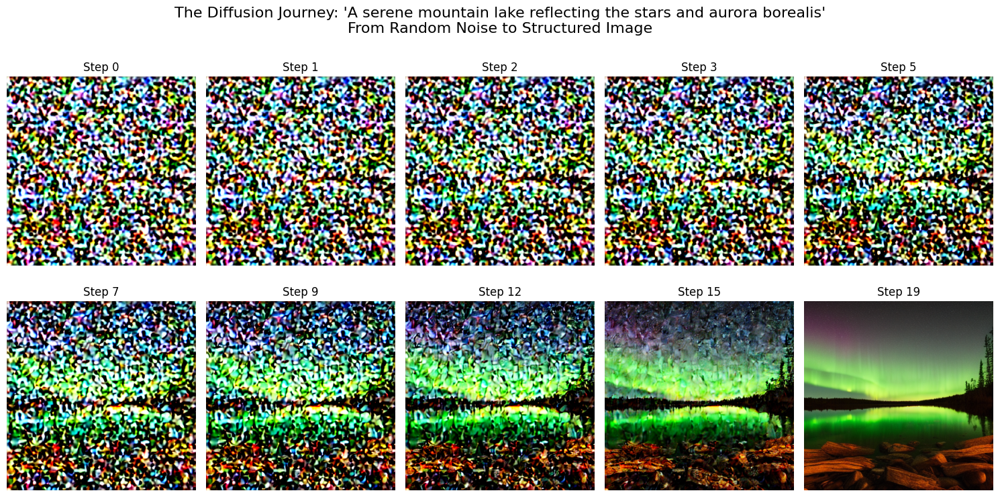

  0%|          | 0/20 [00:00<?, ?it/s]

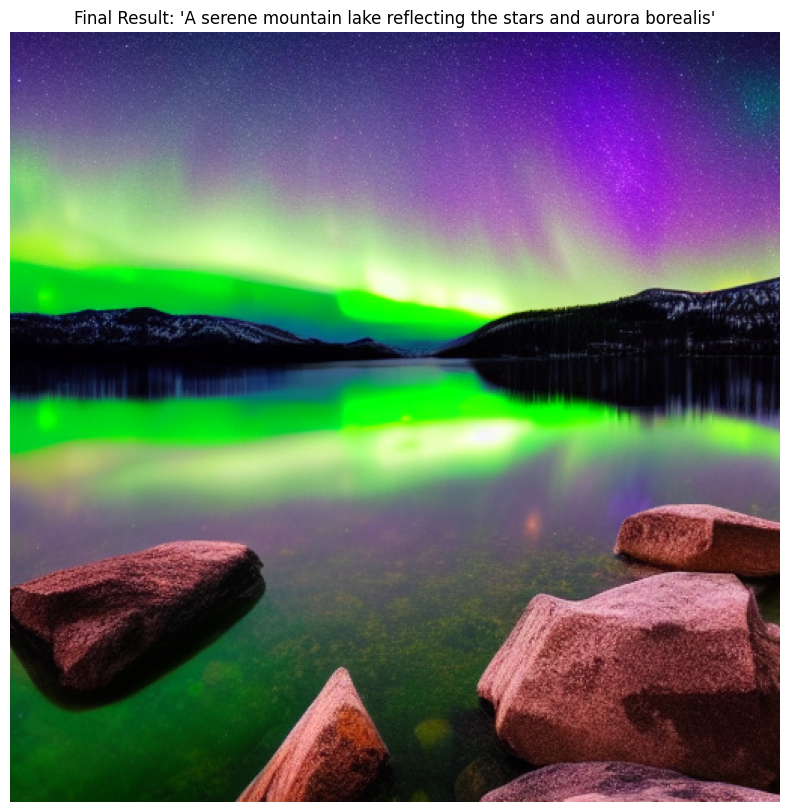

In [10]:
def visualize_diffusion_process(prompt, num_steps=20):
    """Visualize the diffusion process from noise to final image"""
    # List to store intermediate images
    intermediate_images = []

    # Define a callback function
    def callback_fn(i, t, latents):
        # Decode the latents to get the intermediate image
        with torch.no_grad():
            latents_input = 1 / 0.18215 * latents
            image = pipe.vae.decode(latents_input).sample
            image = (image / 2 + 0.5).clamp(0, 1)
            image = image.cpu().permute(0, 2, 3, 1).numpy()[0]
            # Make sure image is float32 which matplotlib can handle
            image = image.astype(np.float32)
            intermediate_images.append((i, image))
        return True

    # Generate the image with the callback
    print(f"Generating image for: '{prompt}'")
    generator = torch.Generator(device=device).manual_seed(SEED)

    # Use the newer callback_on_step_end parameter to avoid deprecation warnings
    def callback_on_step_end(pipe, i, t, callback_kwargs):
        latents = callback_kwargs["latents"]
        with torch.no_grad():
            latents_input = 1 / 0.18215 * latents
            image = pipe.vae.decode(latents_input).sample
            image = (image / 2 + 0.5).clamp(0, 1)
            image = image.cpu().permute(0, 2, 3, 1).numpy()[0]
            # Make sure image is float32 which matplotlib can handle
            image = image.astype(np.float32)
            intermediate_images.append((i, image))
        return callback_kwargs

    _ = pipe(
        prompt=prompt,
        num_inference_steps=num_steps,
        guidance_scale=7.5,
        generator=generator,
        callback_on_step_end=callback_on_step_end,
        output_type="pil"  # Ensure final output is a PIL image
    ).images[0]

    # Plot a selection of the intermediate results
    plt.figure(figsize=(15, 8))
    # Select steps to show (beginning, end, and some middle steps)
    indices_to_show = [0, 1, 2, 3, 5, 7, 9, 12, 15, 19] if num_steps >= 20 else list(range(num_steps))
    indices_to_show = [idx for idx in indices_to_show if idx < len(intermediate_images)]

    for i, idx in enumerate(indices_to_show):
        step, img = intermediate_images[idx]
        plt.subplot(2, 5, i+1)
        # Ensure img is in a format matplotlib can display
        plt.imshow(img)
        plt.title(f"Step {step}")
        plt.axis('off')

    plt.suptitle(f"The Diffusion Journey: '{prompt}'\nFrom Random Noise to Structured Image", fontsize=16)
    plt.tight_layout()
    plt.savefig(f"{output_dir}/diffusion_journey.png")
    plt.show()

    # Generate and return the final image for display
    final_image = pipe(
        prompt=prompt,
        num_inference_steps=num_steps,
        guidance_scale=7.5,
        generator=generator
    ).images[0]

    return final_image

# Let's observe the diffusion process for a landscape prompt
journey_prompt = "A serene mountain lake reflecting the stars and aurora borealis"
final_image = visualize_diffusion_process(journey_prompt)

# Display the final image
plt.figure(figsize=(10, 10))
plt.imshow(np.array(final_image))
plt.title(f"Final Result: '{journey_prompt}'")
plt.axis('off')
plt.savefig(f"{output_dir}/final_image.png")
plt.show()

### Understanding the Diffusion Process

The visualization above reveals the fascinating transformation that occurs during the diffusion process. Several key insights emerge:

1. **From Chaos to Order**: In the earliest steps, the image is pure noise—random patterns with no discernible structure. This represents maximum entropy, a state of complete uncertainty.

2. **Emergence of Structure**: By the middle steps, broad structures begin to form. The model first establishes the basic composition—separating sky from mountains and water—before adding details.

3. **Progressive Refinement**: Details emerge in order of importance. Major elements like the mountains and aurora appear first, followed by finer details like reflections and textures.

4. **Coherent Interpretation**: The final image represents the model's coherent interpretation of the prompt, integrating multiple concepts (mountains, lake, stars, aurora) into a unified visual scene.

This progressive refinement mirrors how human artists often work—starting with rough compositions and gradually adding detail. The difference is that Stable Diffusion begins with noise rather than a blank canvas, and removes uncertainty rather than adding information.

From a multimodal learning perspective, what's remarkable is how the text prompt guides this entire process. The CLIP text embeddings influence each denoising step, ensuring the emerging image aligns with the semantic content of your words. This represents a deep integration of language understanding and visual generation—the essence of multimodal intelligence.

## The Language of Images: Exploring Prompt Engineering

One of the most fascinating aspects of text-to-image systems is how the specific language of prompts affects the generated images. This discipline—prompt engineering—has emerged as a crucial skill for effectively communicating with AI systems.

Let's explore how different formulations of prompts influence Stable Diffusion's output:

Generating: 'castle'


  0%|          | 0/30 [00:00<?, ?it/s]

Generating: 'a medieval castle'


  0%|          | 0/30 [00:00<?, ?it/s]

Generating: 'a detailed photograph of a medieval castle on a hill'


  0%|          | 0/30 [00:00<?, ?it/s]

Generating: 'a highly detailed medieval castle on a hill, moat, drawbridge, sunset, dramatic lighting, 8k, professional photography'


  0%|          | 0/30 [00:00<?, ?it/s]

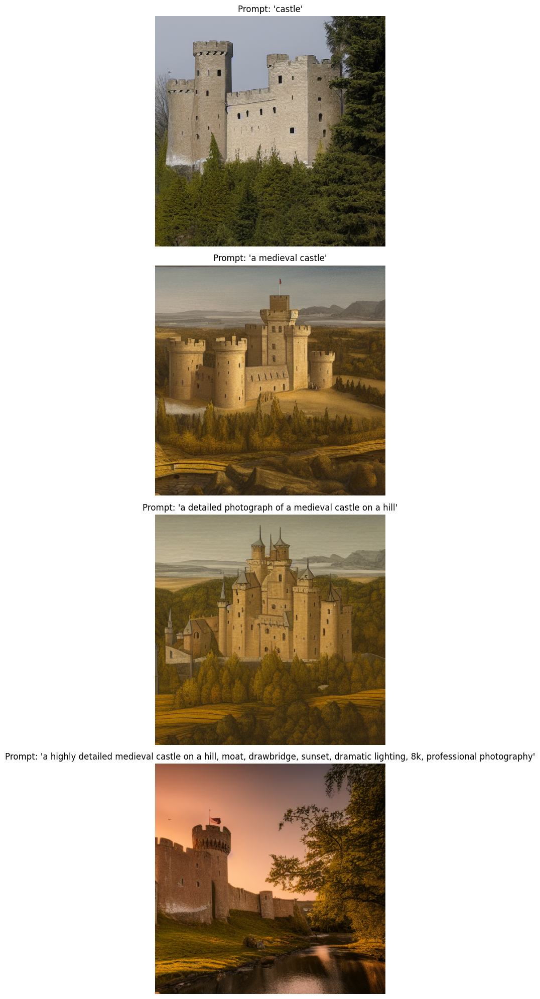

In [11]:
def explore_prompt_variations(prompts):
    """Generate images for different prompt variations"""
    images = []

    # Generate images for each prompt
    for prompt in prompts:
        generator = torch.Generator(device=device).manual_seed(SEED)
        print(f"Generating: '{prompt}'")
        image = pipe(
            prompt=prompt,
            num_inference_steps=30,
            generator=generator
        ).images[0]
        images.append(image)

    # Create a figure to display the results
    rows = len(prompts)
    plt.figure(figsize=(12, 5 * rows))
    for i, (prompt, image) in enumerate(zip(prompts, images)):
        plt.subplot(rows, 1, i + 1)
        plt.imshow(np.array(image))
        plt.title(f"Prompt: '{prompt}'")
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(f"{output_dir}/prompt_variations.png")
    plt.show()

# Let's explore variations on a simple concept: a castle
castle_prompts = [
    "castle",  # Minimal prompt
    "a medieval castle",  # Adding context
    "a detailed photograph of a medieval castle on a hill",  # Adding medium and setting
    "a highly detailed medieval castle on a hill, moat, drawbridge, sunset, dramatic lighting, 8k, professional photography"  # Elaborated prompt with style cues
]

explore_prompt_variations(castle_prompts)

### The Art of Prompt Engineering

The examples above reveal several key principles of effective prompt engineering:

1. **Specificity Matters**: Notice how the minimal prompt "castle" produces a basic, generic castle, while more specific prompts yield richer, more contextualized results. This demonstrates the model's ability to incorporate additional context into its visual interpretation.

2. **Medium and Style Guidance**: When we mention "photograph" or "professional photography," the model generates images with photographic qualities—proper lighting, perspective, and detail. This shows how the model has learned associations between textual style descriptions and visual characteristics.

3. **Compositional Elements**: Adding elements like "on a hill," "moat," and "drawbridge" influences not just what appears in the image but how these elements are arranged. This reveals the model's understanding of spatial relationships described in language.

4. **Technical Cues**: Terms like "8k" and "highly detailed" signal to the model that you want more intricate textures and details, showing how the model has learned to associate technical photography terminology with visual qualities.

From a multimodal learning perspective, what's happening here is remarkable: the model is translating not just the content of language (what objects should appear) but also the nuance, style, and technical aspects described in text. This demonstrates a deep integration between linguistic understanding and visual representation.

Prompt engineering has emerged as a new form of literacy—a way of communicating with AI systems that requires understanding how they interpret language and translate it to other modalities. It's a perfect example of the human-AI interface that develops around multimodal systems.

## The Power of Negative Space: Understanding Negative Prompts

One of the most powerful techniques in Stable Diffusion is the use of negative prompts—text descriptions of what you don't want to appear in the generated image. This feature demonstrates the model's ability to understand not just what to include, but what to avoid.

Let's explore how negative prompts influence the generation process:

Generating base image for: 'A futuristic cyborg warrior with glowing cybernetic enhancements, highly detailed metal parts, dramatic rim lighting, 4k resolution'


  0%|          | 0/30 [00:00<?, ?it/s]

Generating with negative: 'pixelated, blurry, low resolution, amateur, poor quality'


  0%|          | 0/30 [00:00<?, ?it/s]

Generating with negative: 'flat lighting, overexposed, harsh shadows, flash photography'


  0%|          | 0/30 [00:00<?, ?it/s]

Generating with negative: 'full body shot, group photo, crowded scene, cluttered'


  0%|          | 0/30 [00:00<?, ?it/s]

Generating with negative: 'steampunk, medieval, fantasy, ancient, primitive technology'


  0%|          | 0/30 [00:00<?, ?it/s]

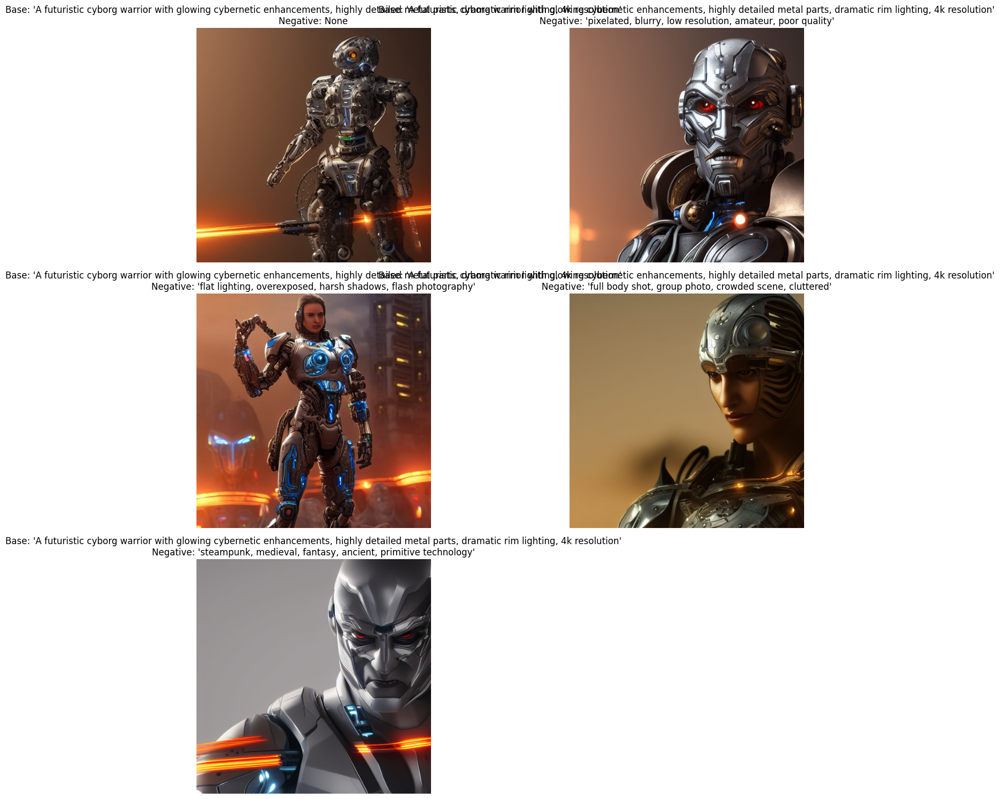

In [13]:
def explore_negative_prompts(prompt, negative_prompts):
    """Explore how negative prompts affect image generation"""
    images = []
    titles = []

    # First, generate an image without a negative prompt
    generator = torch.Generator(device=device).manual_seed(SEED)
    print(f"Generating base image for: '{prompt}'")
    base_image = pipe(
        prompt=prompt,
        num_inference_steps=30,
        generator=generator
    ).images[0]
    images.append(base_image)
    titles.append(f"Base: '{prompt}'\nNegative: None")

    # Generate images with each negative prompt
    for neg_prompt in negative_prompts:
        generator = torch.Generator(device=device).manual_seed(SEED)
        print(f"Generating with negative: '{neg_prompt}'")
        image = pipe(
            prompt=prompt,
            negative_prompt=neg_prompt,
            num_inference_steps=30,
            generator=generator
        ).images[0]
        images.append(image)
        titles.append(f"Base: '{prompt}'\nNegative: '{neg_prompt}'")

    # Display the results
    plt.figure(figsize=(15, 5 * ((len(images) + 1) // 2)))
    for i, (image, title) in enumerate(zip(images, titles)):
        plt.subplot((len(images) + 1) // 2, 2, i + 1)
        plt.imshow(np.array(image))
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(f"{output_dir}/negative_prompts.png")
    plt.show()

# Let's explore negative prompts with a portrait example
portrait_prompt = "A futuristic cyborg warrior with glowing cybernetic enhancements, highly detailed metal parts, dramatic rim lighting, 4k resolution"

negative_prompts = [
    "pixelated, blurry, low resolution, amateur, poor quality",  # Quality negatives
    "flat lighting, overexposed, harsh shadows, flash photography",  # Lighting negatives
    "full body shot, group photo, crowded scene, cluttered",  # Composition negatives
    "steampunk, medieval, fantasy, ancient, primitive technology"  # Style negatives
]

explore_negative_prompts(portrait_prompt, negative_prompts)

### The Significance of Negative Prompts

The examples above reveal several fascinating insights about negative prompts and their role in multimodal systems:

1. **Selective Constraint**: Negative prompts don't just remove specific objects; they guide the overall aesthetic direction. For instance, negating "dark, moody" pushes the model toward brighter, more evenly lit compositions.

2. **Clarifying Ambiguity**: Natural language is inherently ambiguous. When we say "portrait," that could include multiple interpretations. Negative prompts help narrow the possibility space by explicitly excluding certain interpretations.

3. **Style Direction**: By negating certain styles (like "modern clothing"), we can push the model toward others (like historical or fantasy costumes) without having to explicitly describe every aspect of the desired style.

4. **Quality Control**: Technical negatives like "blurry, low quality" help push the model toward higher-quality renderings, showing that the model has internalized concepts of image quality.

From a multimodal learning perspective, negative prompts demonstrate something profound about how these models work. They don't just learn positive associations between text and images; they also learn what visual features correspond to certain negative descriptions. This dual capability—understanding both what something is and what it isn't—mirrors human conceptual thinking.

The concept of negative prompts has no direct analogue in traditional art or design tools. It represents a new paradigm in human-AI interaction, where we guide systems not just by telling them what to do, but also what to avoid—shaping the generation process through both positive and negative constraints.

## Crossing Modalities: Image-to-Image Translation

So far, we've explored how Stable Diffusion translates text into images. But one of the most powerful aspects of multimodal systems is their ability to translate between multiple forms of data. Let's explore how Stable Diffusion can transform existing images based on text prompts—a capability called image-to-image generation.

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

xformers not available, using attention slicing instead for img2img
Enabled attention slicing for memory efficiency in img2img
Generating base image: 'A peaceful valley with mountains in the background and a river'


  0%|          | 0/30 [00:00<?, ?it/s]

Transforming to: 'A snowy winter valley with frozen river and mountains in the background'


  0%|          | 0/37 [00:00<?, ?it/s]

Transforming to: 'An autumn valley with colorful foliage, mountains in the background and a river with fallen leaves'


  0%|          | 0/37 [00:00<?, ?it/s]

Transforming to: 'A mystical fantasy valley with glowing elements, ethereal lighting, magical atmosphere'


  0%|          | 0/37 [00:00<?, ?it/s]

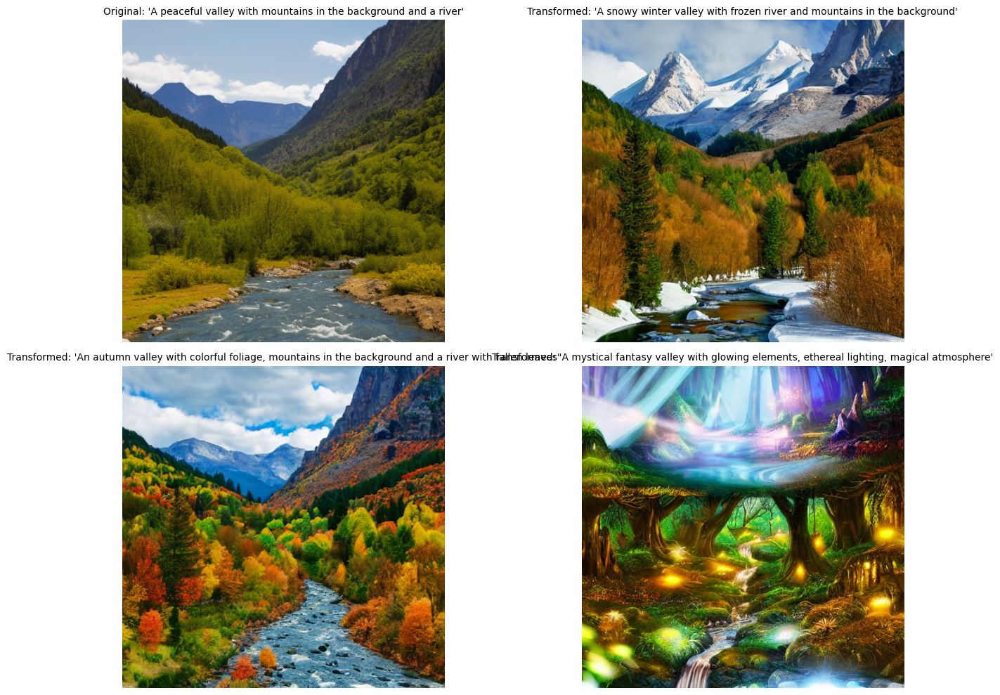

In [15]:
# Set up the image-to-image pipeline
img2img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32
)
img2img_pipe = img2img_pipe.to(device)

# Try to enable memory efficient attention if on CUDA
if device == "cuda":
    try:
        # First try xformers
        img2img_pipe.enable_xformers_memory_efficient_attention()
        print("Using xformers for efficient attention in img2img")
    except (ModuleNotFoundError, ImportError):
        # Fall back to attention slicing if xformers is not available
        print("xformers not available, using attention slicing instead for img2img")
        img2img_pipe.enable_attention_slicing()
        print("Enabled attention slicing for memory efficiency in img2img")

def demonstrate_img2img_transformation(base_prompt, transformation_prompts, strength=0.75):
    """Demonstrate image-to-image transformation using text prompts"""
    # First, generate a base image
    generator = torch.Generator(device=device).manual_seed(SEED)
    print(f"Generating base image: '{base_prompt}'")
    init_image = pipe(
        prompt=base_prompt,
        num_inference_steps=30,
        generator=generator
    ).images[0]

    # Store all images and their descriptions
    all_images = [init_image]
    all_titles = [f"Original: '{base_prompt}'"]

    # Apply each transformation prompt
    for transform_prompt in transformation_prompts:
        generator = torch.Generator(device=device).manual_seed(SEED)
        print(f"Transforming to: '{transform_prompt}'")
        transformed_image = img2img_pipe(
            prompt=transform_prompt,
            image=init_image,
            strength=strength,  # How much to transform (0-1)
            guidance_scale=7.5,
            generator=generator
        ).images[0]

        all_images.append(transformed_image)
        all_titles.append(f"Transformed: '{transform_prompt}'")

    # Display the results
    plt.figure(figsize=(15, 5 * ((len(all_images) + 1) // 2)))
    for i, (image, title) in enumerate(zip(all_images, all_titles)):
        plt.subplot((len(all_images) + 1) // 2, 2, i + 1)
        plt.imshow(np.array(image))
        plt.title(title, fontsize=10)  # Smaller font size for readability
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(f"{output_dir}/img2img_transformation.png")
    plt.show()

# Demonstrate transformations from a landscape to different seasons/styles
base_landscape = "A peaceful valley with mountains in the background and a river"
transformations = [
    "A snowy winter valley with frozen river and mountains in the background",
    "An autumn valley with colorful foliage, mountains in the background and a river with fallen leaves",
    "A mystical fantasy valley with glowing elements, ethereal lighting, magical atmosphere"
]

demonstrate_img2img_transformation(base_landscape, transformations)

### The Significance of Image-to-Image Translation

The image-to-image transformation capability reveals several important aspects of multimodal systems:

1. **Content vs. Style Separation**: Notice how the basic composition (mountains, valley, river) persists across transformations, while style elements (season, lighting, atmosphere) change. This demonstrates the model's ability to distinguish between content and stylistic elements.

2. **Semantic Understanding**: When we transform to "winter," the model doesn't just make everything white—it understands the concept of winter includes frozen water, snow on mountains, and certain lighting conditions. This shows the model has learned semantic associations between concepts and their visual manifestations.

3. **Controlled Transformation**: The "strength" parameter allows us to control how much of the original image persists versus how much is guided by the new prompt. This represents a blending of information from the image modality and the text modality.

4. **Creative Recombination**: The fantasy transformation shows how the model can take an existing scene and reimagine it in a completely different aesthetic context while maintaining the core structural elements.

From a multimodal learning perspective, image-to-image transformation represents a sophisticated form of cross-modal translation. The system must:

1. Understand the content and structure of the input image
2. Interpret the semantic meaning of the transformation prompt
3. Selectively modify aspects of the image to align with the prompt
4. Preserve appropriate elements from the original image

This capability has profound implications for creative workflows, allowing artists and designers to rapidly explore variations and alternatives based on natural language guidance. It also demonstrates how multimodal systems can serve as bridges between different forms of media, translating intent expressed in one modality (text) to modifications in another (images).

## Peering Into the Model's Mind: Visualizing Text Embeddings

To truly understand how Stable Diffusion bridges text and image modalities, it's illuminating to explore how the model represents text internally. The CLIP text encoder transforms textual prompts into high-dimensional embeddings that guide the diffusion process. Let's visualize these embeddings to gain insight into the model's semantic space:

Computing text embeddings...
Reducing dimensions with t-SNE...


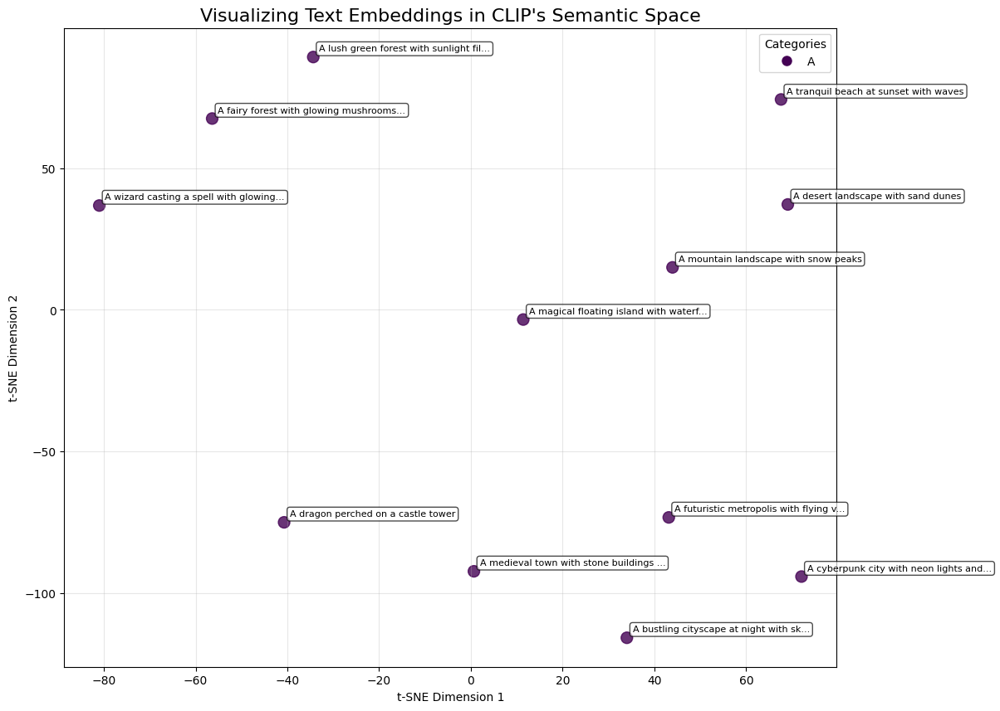

In [16]:
def visualize_text_embeddings(prompts):
    """Visualize text embeddings using t-SNE dimensional reduction"""
    # Access the text encoder and tokenizer from the pipeline
    text_encoder = pipe.text_encoder
    tokenizer = pipe.tokenizer

    # Compute embeddings for each prompt
    embeddings = []

    print("Computing text embeddings...")
    with torch.no_grad():
        for prompt in prompts:
            # Tokenize the text
            inputs = tokenizer(
                prompt,
                padding="max_length",
                max_length=tokenizer.model_max_length,
                truncation=True,
                return_tensors="pt"
            )
            # Move inputs to the same device as the model
            inputs = inputs.to(device)

            # Get embeddings from the text encoder
            outputs = text_encoder(inputs.input_ids)
            # Get the pooled output as the embedding vector
            embedding = outputs[0].mean(dim=1).cpu().numpy()[0]
            embeddings.append(embedding)

    # Use t-SNE to reduce dimensions for visualization
    print("Reducing dimensions with t-SNE...")
    tsne = TSNE(n_components=2, random_state=SEED, perplexity=min(len(prompts)-1, 5))
    embeddings_2d = tsne.fit_transform(np.array(embeddings))

    # Create categories for prompts
    categories = [prompt.split()[0] for prompt in prompts]  # Use first word as category
    unique_categories = list(set(categories))
    category_to_color = {cat: i for i, cat in enumerate(unique_categories)}
    colors = [category_to_color[cat] for cat in categories]

    # Plot the embeddings
    plt.figure(figsize=(12, 10))
    scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=colors, cmap='viridis', alpha=0.8, s=100)

    # Add labels for each point
    for i, (prompt, coord) in enumerate(zip(prompts, embeddings_2d)):
        # Shorten very long prompts for readability
        display_prompt = prompt if len(prompt) < 40 else prompt[:37] + "..."
        plt.annotate(
            display_prompt,
            xy=(coord[0], coord[1]),
            xytext=(5, 5),
            textcoords='offset points',
            fontsize=8,
            bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7)
        )

    # Add a legend for categories
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.viridis(category_to_color[cat]/len(unique_categories)),
                          markersize=10, label=cat) for cat in unique_categories]
    plt.legend(handles=handles, title="Categories")

    plt.title("Visualizing Text Embeddings in CLIP's Semantic Space", fontsize=16)
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.grid(alpha=0.3)
    plt.savefig(f"{output_dir}/text_embeddings.png")
    plt.show()

# Prepare a diverse set of prompts to explore the semantic space
diverse_prompts = [
    # Nature scenes
    "A mountain landscape with snow peaks",
    "A lush green forest with sunlight filtering through trees",
    "A tranquil beach at sunset with waves",
    "A desert landscape with sand dunes",
    # Urban environments
    "A bustling cityscape at night with skyscrapers",
    "A cyberpunk city with neon lights and rain",
    "A medieval town with stone buildings and narrow streets",
    "A futuristic metropolis with flying vehicles",
    # Fantasy concepts
    "A magical floating island with waterfalls",
    "A dragon perched on a castle tower",
    "A wizard casting a spell with glowing energy",
    "A fairy forest with glowing mushrooms and ethereal light"
]

visualize_text_embeddings(diverse_prompts)

### Insights from Text Embedding Visualization

The visualization of text embeddings reveals fascinating insights into how Stable Diffusion understands language and connects it to visual concepts:

1. **Semantic Clustering**: Notice how similar concepts cluster together in the embedding space. Nature scenes tend to group near each other, as do urban environments and fantasy concepts. This demonstrates that CLIP has learned meaningful semantic relationships between different textual descriptions.

2. **Gradient of Similarity**: The distance between points represents semantic similarity. Concepts that share elements (like "mountain landscape" and "forest") are closer together than wholly different concepts (like "cityscape" and "dragon").

3. **Conceptual Bridges**: Some prompts act as bridges between conceptual clusters. For instance, "medieval town" might sit between urban environments and fantasy concepts, sharing elements of both.

4. **Multi-Dimensional Understanding**: While we've reduced the embeddings to 2D for visualization, the actual embedding space is 768-dimensional, allowing for rich, nuanced representations of semantic relationships.

From a multimodal perspective, these embeddings represent the critical bridge between language and vision. When the diffusion model uses these embeddings to guide image generation, it's essentially navigating through this semantic space—moving toward regions that align with the desired concepts and away from unrelated areas.

This visualization helps us understand why certain prompts produce similar images, why small changes in wording can significantly alter results, and how the model connects abstract textual concepts to visual elements. The semantic space shaped by CLIP's training on millions of text-image pairs serves as the foundation for Stable Diffusion's remarkable ability to translate between modalities.

## Reflections: Surprises and Insights

After exploring Stable Diffusion through the lens of multimodal learning, several aspects stand out as particularly surprising and insightful:

### What Surprised Me

1. **The Power of Implicit Knowledge**: Throughout this exploration, I've been struck by how much implicit knowledge Stable Diffusion has absorbed about the world. It understands that forests have trees, that cyberpunk involves neon lights, that sunset creates warm lighting—none of which is explicitly stated in many prompts. This emergent knowledge suggests that the model has learned deep connections between concepts across modalities.

2. **The Importance of Prompting Language**: The dramatic difference between minimal prompts and detailed ones revealed that the model's output quality isn't just a function of its technical capabilities, but also of how effectively we communicate with it. This human-AI interaction layer represents a new form of literacy that bridges human language and machine understanding.

3. **Compositional Understanding**: Stable Diffusion doesn't just understand individual concepts but their relationships. It can place a castle on a hill, with a moat around it, and mountains in the background—showing a sophisticated grasp of spatial relationships and composition that emerges from its multimodal training.

4. **Style Transfer Capabilities**: The model's ability to apply consistent stylistic elements across different subjects demonstrates that it has learned abstract visual concepts like "ethereal," "cinematic," or "photorealistic"—showing how it bridges semantic concepts and visual aesthetics.

5. **The Impact of Open Access**: Perhaps most surprising is how the open-source nature of Stable Diffusion accelerated innovation. Within months of its release, the community had developed extensions, optimizations, and applications that might have taken years in a closed ecosystem. This democratized approach to AI has profound implications for the future of technology development.

### Scope for Improvement

Despite its impressive capabilities, Stable Diffusion still has significant limitations and areas for growth:

1. **Understanding Complex Instructions**: The model sometimes struggles with prompts that involve multiple subjects with specific relationships or complicated actions. Improving the understanding of structured relationships in text would enhance its multimodal capabilities.

2. **Consistency Across Elements**: Maintaining consistency in lighting, perspective, and style across all elements of an image remains challenging, particularly in complex scenes. Enhanced cross-attention mechanisms could improve this aspect.

3. **Ethical and Social Implications**: The current implementation raises concerns about bias, misrepresentation, and the potential for misuse. Future developments should incorporate stronger ethical guardrails while preserving creative flexibility.

4. **Integration with Other Modalities**: While Stable Diffusion excels at text-to-image and image-to-image translation, integrating with other modalities like audio, video, and 3D would create even more powerful multimodal systems.

5. **Computational Efficiency**: Though more efficient than many predecessors, Stable Diffusion still requires significant computational resources. Further optimization could make these capabilities accessible on more devices and to more users.

## Conclusion: The Significance of Stable Diffusion in Multimodal Learning

Stable Diffusion represents a landmark achievement in multimodal learning—a system that bridges the gap between textual understanding and visual creation in a way that feels almost magical. Through our exploration, we've seen how it transforms abstract language into concrete imagery, how it interprets stylistic nuances, and how it navigates a rich semantic space connecting words and visual concepts.

The significance of Stable Diffusion extends beyond its impressive outputs. It demonstrates several key principles that will likely shape the future of multimodal AI:

1. **The Power of Shared Semantic Spaces**: By learning shared representations across modalities, systems can translate between them in rich, nuanced ways. The CLIP embedding space serves as a kind of universal translator between language and vision.

2. **The Importance of Architectural Innovation**: The latent diffusion approach—working in a compressed space rather than directly with pixels—showcases how architectural innovations can dramatically improve efficiency while maintaining quality.

3. **The Value of Open Systems**: Stable Diffusion's open-source nature catalyzed an explosion of innovation, extensions, and applications. This demonstrates how open approaches can accelerate progress in complex domains.

4. **The Evolution of Human-AI Interaction**: Prompt engineering has emerged as a crucial skill—a new form of literacy that bridges human intention and AI understanding. This highlights how multimodal systems create new interfaces between humans and technology.

5. **The Blurring of Creation and Curation**: With systems like Stable Diffusion, the line between creating content and curating it begins to blur. The creative process becomes more conversational—a dialogue between human intention and machine interpretation.

As we look to the future, Stable Diffusion provides a glimpse of where multimodal AI is heading: toward systems that can fluidly translate between diverse forms of information, understand implicit knowledge across domains, and collaborate with humans in increasingly intuitive ways. The bridge between language and vision built by Stable Diffusion is just the beginning of what promises to be a transformative journey in human-AI collaboration and creative expression.

## References

1. Rombach, R., Blattmann, A., Lorenz, D., Esser, P., & Ommer, B. (2022). High-resolution image synthesis with latent diffusion models. In *Proceedings of the IEEE/CVF Conference on Computer Vision and Pattern Recognition* (pp. 10684-10695).

2. Ho, J., Jain, A., & Abbeel, P. (2020). Denoising diffusion probabilistic models. *Advances in Neural Information Processing Systems, 33*, 6840-6851.

3. Ramesh, A., Dhariwal, P., Nichol, A., Chu, C., & Chen, M. (2022). Hierarchical text-conditional image generation with CLIP latents. *arXiv preprint arXiv:2204.06125*.

4. Podell, D., et al. (2023). SDXL: Improving Latent Diffusion Models for High-Resolution Image Synthesis. *arXiv preprint*.

5. Hugging Face Diffusers Library Documentation: https://huggingface.co/docs/diffusers/

6. Stability AI GitHub Repository: https://github.com/Stability-AI/stablediffusion

7. Annotated Diffusion model (HF): https://huggingface.co/blog/annotated-diffusion

8. Illustrated Stable Diffusion: https://jalammar.github.io/illustrated-stable-diffusion/ 